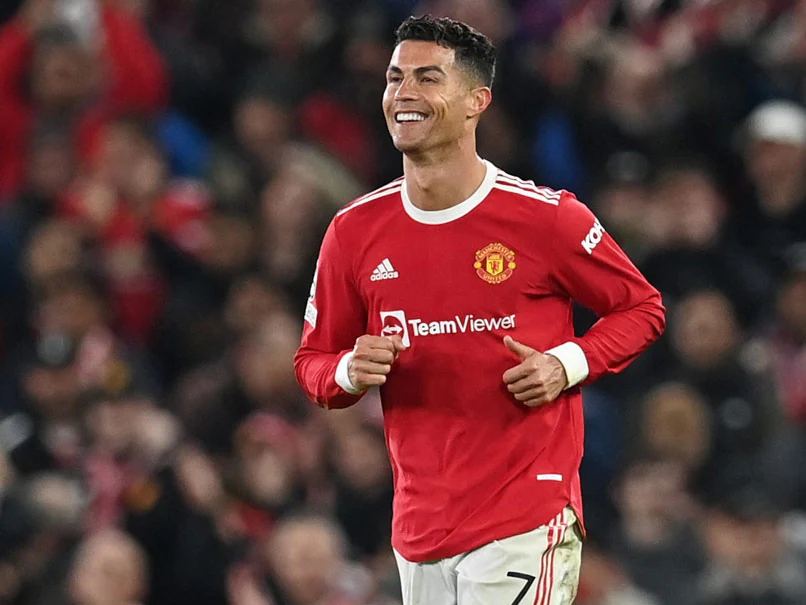

(605, 806, 3)


In [123]:
#code is part of question 1
import cv2
from matplotlib import pyplot as plt
import numpy as np
from skimage import exposure
#importing all the libraries required
image=cv2.imread('cr7.jpeg', cv2.IMREAD_UNCHANGED) #reading image using open cv cv2.IMREAD_UNCHANGED used to avoid error (idea taken from stack overflow) 
cv2_imshow(image) #to display image
dimension=image.shape #to get its shape
print(dimension) # to print the shape

In [124]:
# this code is for question 2
print("Pixel at (0, 0) - Red: {}, Green: {}, Blue: {}".format(r, g, b))
for i in range(5):
  for j in range(5):
      (b, g, r) = image[i, j] #for getting rgb values for  pixel at x=i, y=j
      print("Pixel value at",i,j)
      print("Red: {}, Green: {}, Blue: {}".format(r, g, b))
# for Printing the pixel intensities of a small section of the main image,
# origin is top left corner of the image

Pixel at (0, 0) - Red: 15, Green: 16, Blue: 20
Pixel value at 0 0
Red: 13, Green: 17, Blue: 20
Pixel value at 0 1
Red: 13, Green: 17, Blue: 20
Pixel value at 0 2
Red: 13, Green: 17, Blue: 20
Pixel value at 0 3
Red: 13, Green: 17, Blue: 20
Pixel value at 0 4
Red: 15, Green: 16, Blue: 20
Pixel value at 1 0
Red: 13, Green: 17, Blue: 20
Pixel value at 1 1
Red: 13, Green: 17, Blue: 20
Pixel value at 1 2
Red: 13, Green: 17, Blue: 20
Pixel value at 1 3
Red: 13, Green: 17, Blue: 20
Pixel value at 1 4
Red: 15, Green: 16, Blue: 20
Pixel value at 2 0
Red: 13, Green: 17, Blue: 20
Pixel value at 2 1
Red: 13, Green: 17, Blue: 20
Pixel value at 2 2
Red: 13, Green: 17, Blue: 20
Pixel value at 2 3
Red: 13, Green: 17, Blue: 20
Pixel value at 2 4
Red: 15, Green: 16, Blue: 20
Pixel value at 3 0
Red: 13, Green: 17, Blue: 20
Pixel value at 3 1
Red: 13, Green: 17, Blue: 20
Pixel value at 3 2
Red: 13, Green: 17, Blue: 20
Pixel value at 3 3
Red: 13, Green: 17, Blue: 20
Pixel value at 3 4
Red: 15, Green: 16, Bl

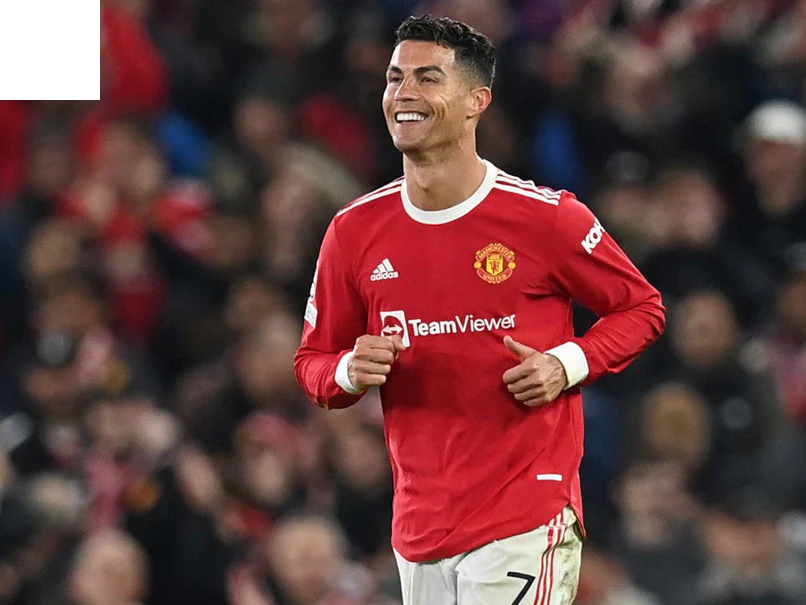

In [125]:
#code is for question 3
img3=image.copy()
for i in range(100):
  for j in range(100):
    img3[i,j]=(255,255,255) #overwriting values to 255
cv2_imshow(img3)
#the small window becomes white as 255 represents white

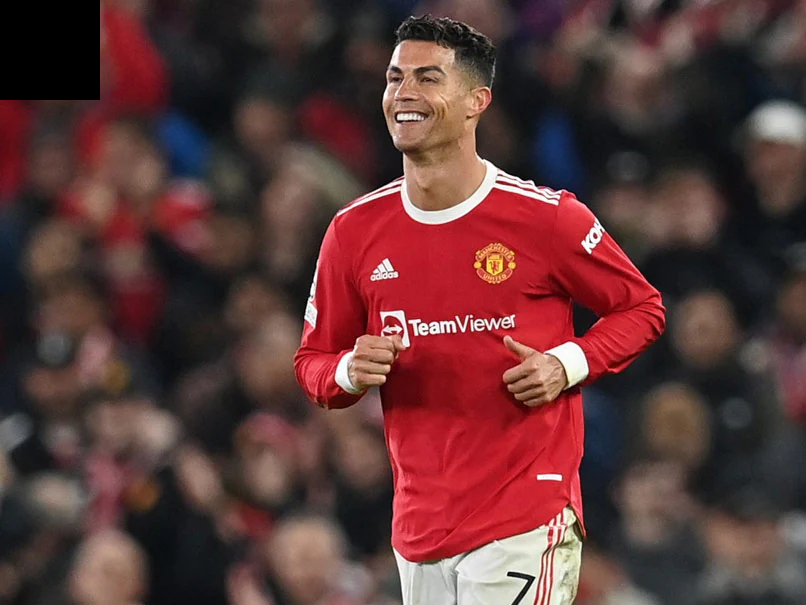

In [126]:
#code is for question 4
img4=image.copy()
for i in range(100):
  for j in range(100):
    img4[i,j]=(256,256,256) #overwriting values to 255
cv2_imshow(img4)
#the small window becomes black

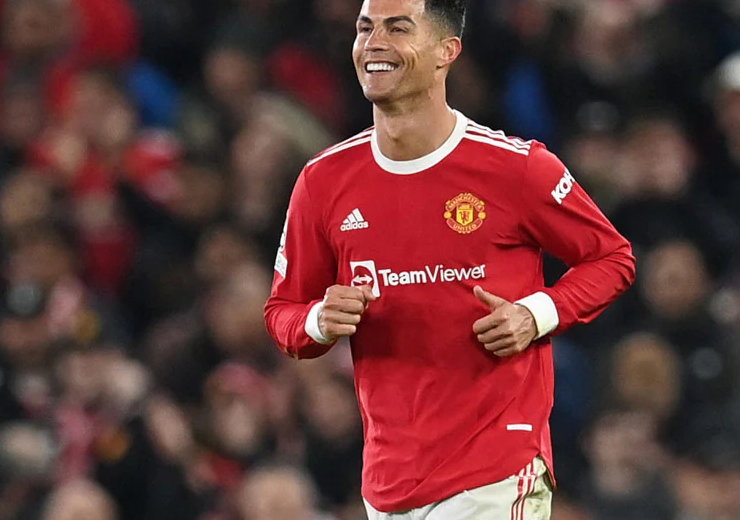

In [127]:
# code for question 5
# slicing image from borders leaving margins storing in new image croped and displaying it
croped=image[50:570, 30:770] 
cv2_imshow(croped)

In [128]:
# code is for question 6
cv2.imwrite('newimage.png',croped)
# saving cropped image as newimage.png

True

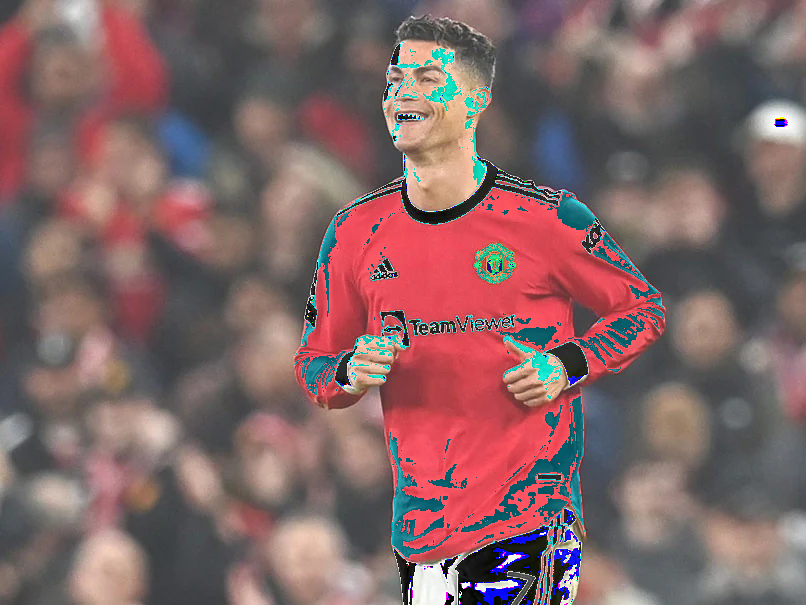

In [129]:
#code for question 7 
img7=image.copy()
for i in range(605):
  for j in range(806):
    img7[i,j]=img7[i,j]+(50,50,50) #adding 50 to each pixel 
cv2_imshow(img7)
# rgb values change thus color also changes

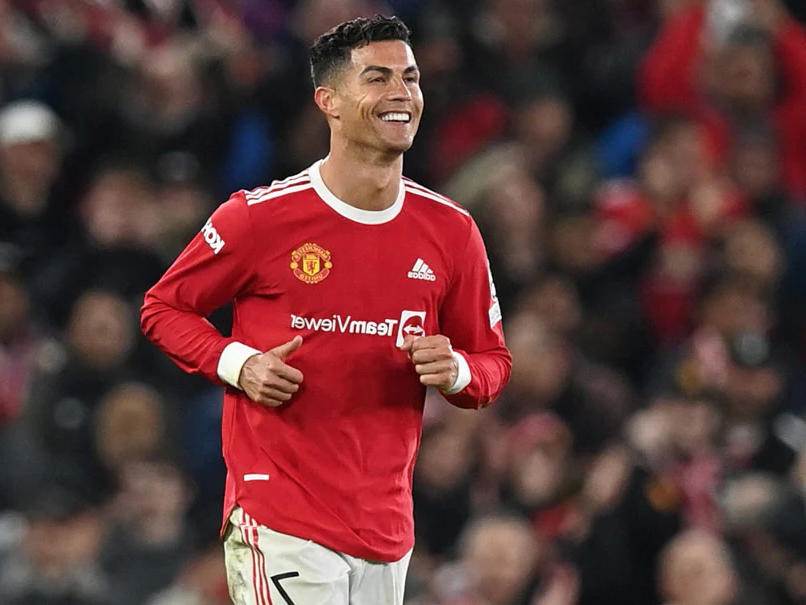

In [130]:
# code is for question 8
flipped= cv2.flip(image, 1) #syntax to flip the image around y axis was learnt from techtutorialsx.com 
cv2_imshow(flipped)

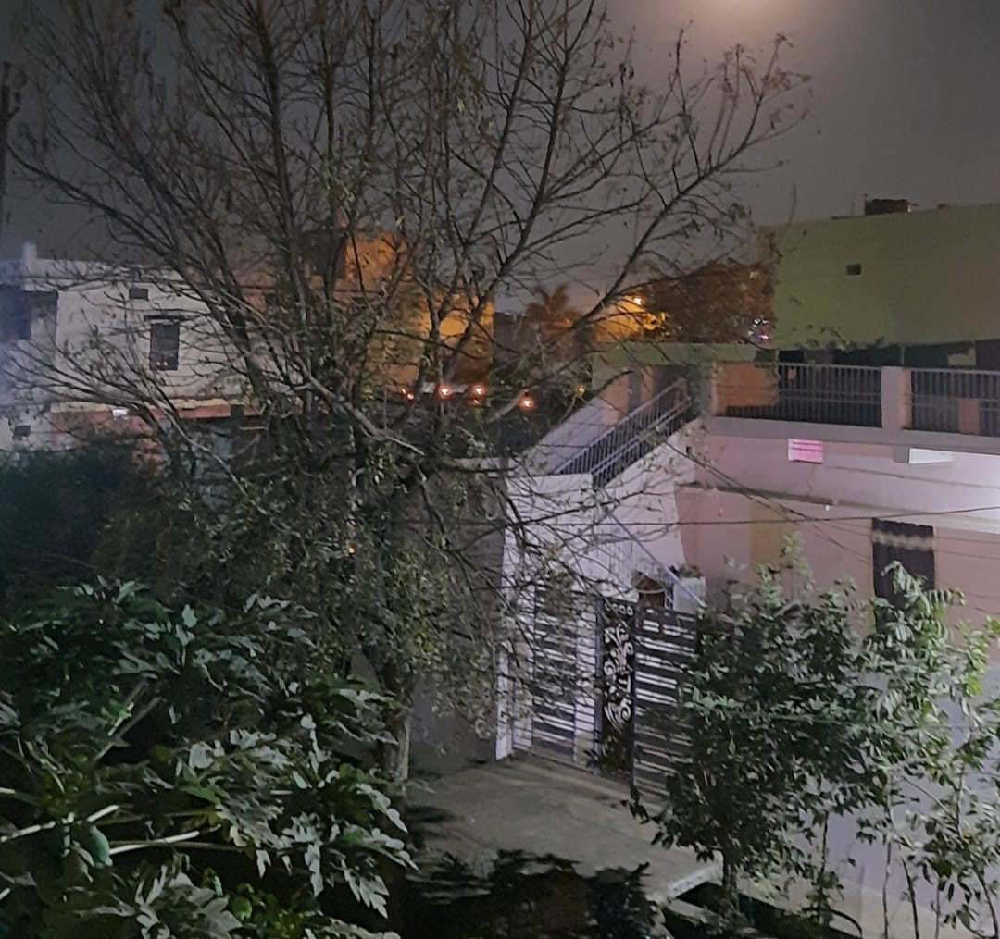

In [131]:
#code for question 9 
nightshot=cv2.imread('ns.jpeg', cv2.IMREAD_UNCHANGED)
cv2_imshow(nightshot)
# just reading the nightshot image

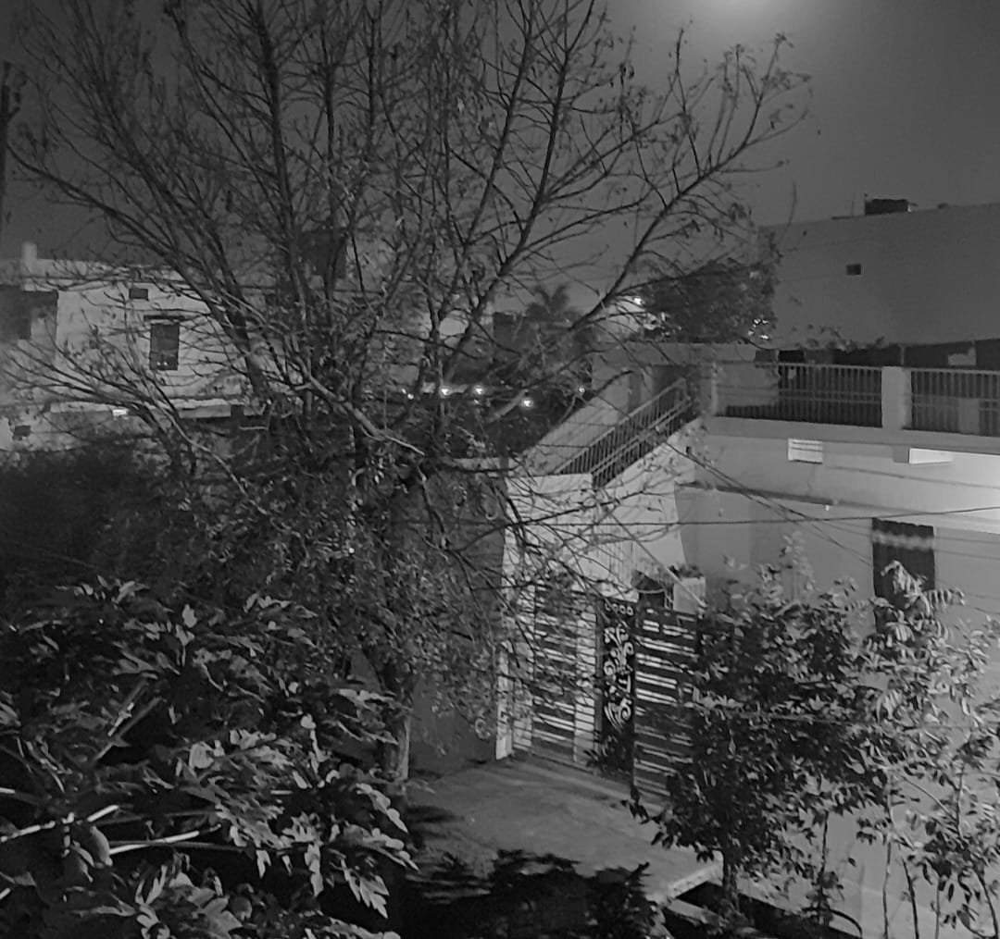

(1015, 1080)


In [132]:
#code for question 9
gray_image=cv2.cvtColor(nightshot, cv2.COLOR_BGR2GRAY)
#converting to grayscale
#source: https://www.geeksforgeeks.org/python-grayscaling-of-images-using-opencv/
cv2_imshow(gray_image)
print(gray_image.shape)


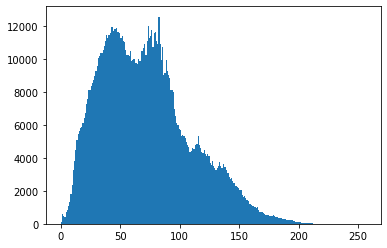

In [133]:
# displaying histogram
#code for question 9
plt.hist(gray_image.ravel(),256,[0,256])
#source: geeks for geeks using matplotlib 
plt.show()

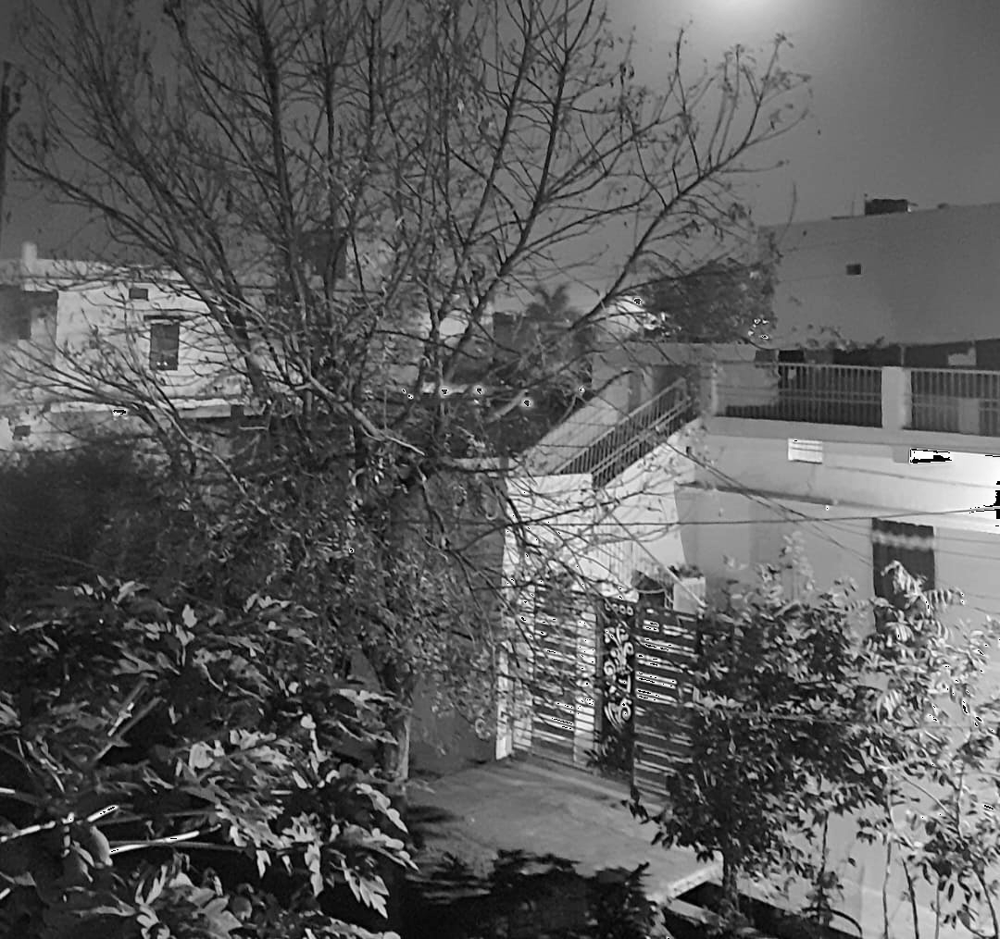

In [134]:
#code for question 10
#Brightening the image by multiplying pixel values with 1.3
img10=gray_image.copy()
for i in range(1015):
  for j in range(1080):
    img10[i,j]=img10[i,j]*1.3
cv2_imshow(img10)

In [135]:
#code for question 11
def gammaCorrection(src, gamma):
    invGamma = 1 / gamma

    table = [((i / 255) ** invGamma) * 255 for i in range(256)]
    #using the formula (i / 255) ** invGamma we store all values in table then we form image array
    table = np.array(table, np.uint8)
    return cv2.LUT(src, table)
    #help has been taken from internet for forming image aaray source: lindevs.com
img11=gray_image.copy()
gammaImg = gammaCorrection(img11, 1.5)
# i found 1.5 as optimal value

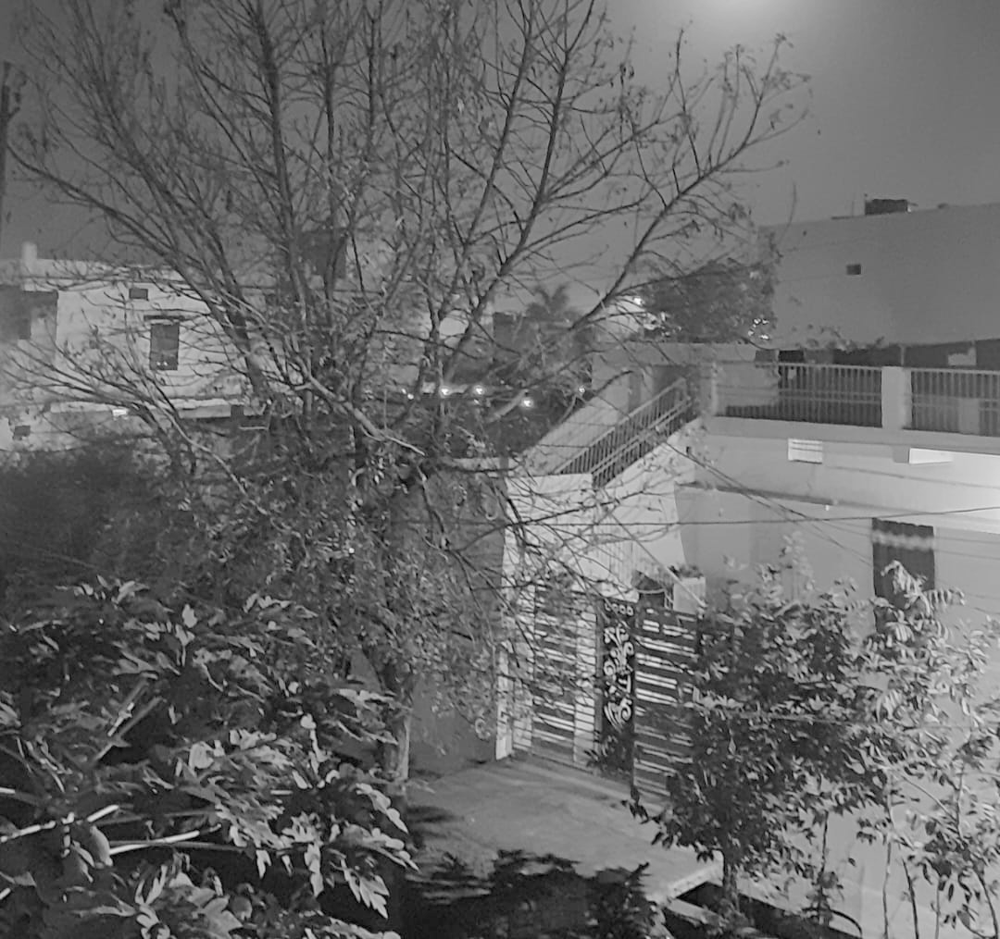

In [136]:
#code for question 11
cv2_imshow(gammaImg)

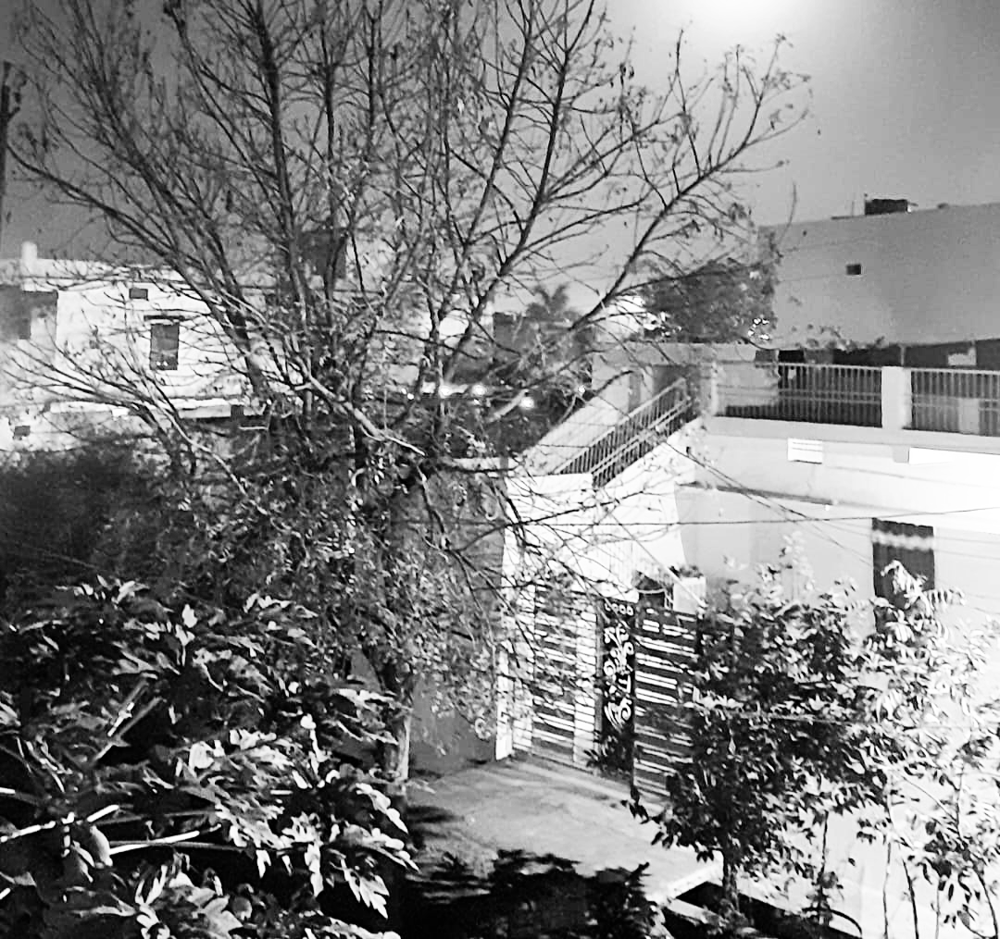

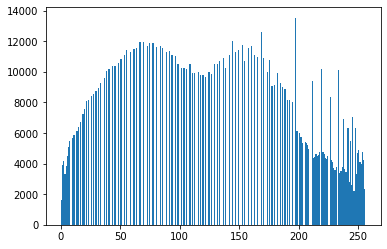

In [137]:
# question 12
# source : https://opencv24-python-tutorials.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_histograms/py_histogram_equalization/py_histogram_equalization.html
equ = cv2.equalizeHist(gammaImg) #just a command of open cv for histogram equalizing 
cv2_imshow(equ)
plt.hist(equ.ravel(),256,[0,256])
plt.show()

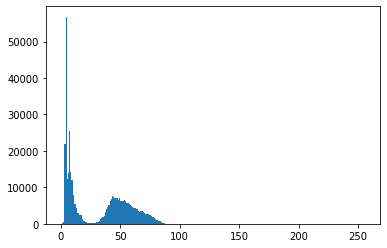

In [138]:
#code for part 13
ref=cv2.imread('refrence.jpeg', cv2.IMREAD_UNCHANGED) #reading refrence image
gray_ref=cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY) #converting to gray scale
plt.hist(gray_ref.ravel(),256,[0,256])
plt.show()
#plotting histogram of refrence image

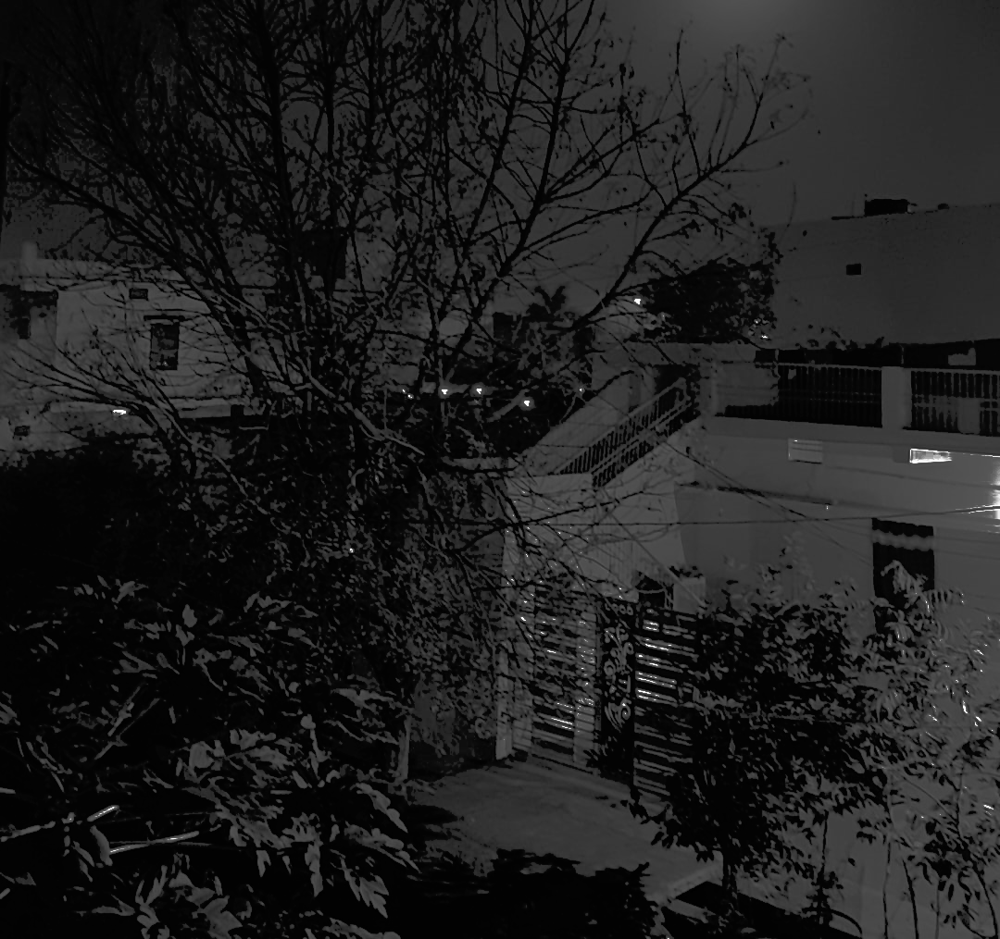

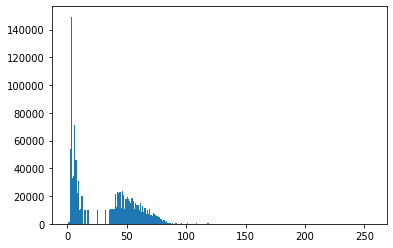

In [139]:
matched = exposure.match_histograms(gray_image,gray_ref) #syntax taken from internet https://scikit-image.org/docs/stable/auto_examples/color_exposure/plot_histogram_matching.html#:~:text=It%20manipulates%20the%20pixels%20of,input%20image%20and%20the%20reference.
matched=matched.astype(np.uint8) #converting to int from float
cv2_imshow(matched)
plt.hist(matched.ravel(),256,[0,256])
plt.show()
#plotting matched photo and its histogram
